# Advanced Certification in AIML
## A Program by IIIT-H and TalentSprint

The objective of this experiment is to understand Siamese Network.

Tons of data area available on the web (wikipedia, Google, Twitter, YouTube) that could be used to train an ML model.
One such source is Google Images. You enter a text query and Google Images shows thousands of related images based on the query and text that are present on the web page with the related image.

In this experiment we would crawl images from Google Images and try to use this as data for training.

1. Your task is to search for face images for 'AamairKhan', 'Rimisen', 'Kajol', 'KareenaKapoor','RishiKapoor', 'AmrishPuri', 'AnilKapoor', 'AnupamKher', 'BomanIrani', 'HrithikRoshan', 'KajalAgarwal', 'KatrinaKaif', 'Madhavan', 'MadhuriDixit', 'Umashri', 'Trisha'

2. Refine your search to faces (Google Images -> enter query -> Tools -> Type -> Face). You could also use movies', ads' names as additional query (e.g., "Aamir 3 idiots", "Boman Irani Khosla Ka Ghosla", "Katrina Slice ad" etc.). The results are noisy but they are useful, and moreover, they are avaible in abundance and for free!

    a. Example: https://www.google.co.in/search?client=firefox-b-ab&dcr=0&biw=1366&bih=628&tbs=itp%3Aface&tbm=isch&sa=1&ei=5gbIWtCjN4n2vgSCoqzYBw&q=biswa+kalyan+rath

3. Then use a browser extensions to download all the results into a directory. In this way you, would get around 300-600 images for each class. Overall, you should collect atleast 10000 images.
    
    a. Firefox: https://addons.mozilla.org/en-US/firefox/addon/google-images-downloader/
    
    b. Chrome: https://chrome.google.com/webstore/detail/download-all-images/ifipmflagepipjokmbdecpmjbibjnakm/related?hl=en
    
4. **Without cleaning** use these images as your training data. Test you results on IMFDB test set.



#### Run the Notebook on GPU

#### Setup Steps

In [0]:
#@title Please enter your registration id to start: (e.g. P181900101) { run: "auto", display-mode: "form" }
Id = "P181902267" #@param {type:"string"}


In [0]:
#@title Please enter your password (normally your phone number) to continue: { run: "auto", display-mode: "form" }
password = "9177074440" #@param {type:"string"}


In [4]:
#@title Run this cell to complete the setup for this Notebook

from IPython import get_ipython
ipython = get_ipython()
  
notebook="BLR_M3W13_SAT_EXP_6" #name of the notebook

def setup():
    ipython.magic("sx pip3 install torch")
    ipython.magic("sx pip install torchvision")
    ipython.magic("sx wget https://cdn.talentsprint.com/aiml/Experiment_related_data/One_shot_Face_recognition.zip")
    ipython.magic("sx unzip  One_shot_Face_recognition.zip")
    ipython.magic("sx wget https://cdn.talentsprint.com/aiml/Experiment_related_data/data_loader.py")
    ipython.magic("sx cd One_shot_Face_recognition")
    print ("Setup completed successfully")
    return


def submit_notebook():
    
    ipython.magic("notebook -e "+ notebook + ".ipynb")
    
    import requests, json, base64, datetime

    url = "https://dashboard.talentsprint.com/xp/app/save_notebook_attempts"
    if not submission_id:
      data = {"id" : getId(), "notebook" : notebook, "mobile" : getPassword()}
      r = requests.post(url, data = data)
      r = json.loads(r.text)

      if r["status"] == "Success":
          return r["record_id"]
      elif "err" in r:        
        print(r["err"])
        return None        
      else:
        print ("Something is wrong, the notebook will not be submitted for grading")
        return None

    elif getComplexity() and getAdditional() and getConcepts():
      f = open(notebook + ".ipynb", "rb")
      file_hash = base64.b64encode(f.read())

      data = {"complexity" : Complexity, "additional" :Additional, 
              "concepts" : Concepts, "record_id" : submission_id, 
              "id" : Id, "file_hash" : file_hash, "notebook" : notebook}

      r = requests.post(url, data = data)
      print("Your submission is successful.")
      print("Ref Id:", submission_id)
      print("Date of submission: ", datetime.datetime.now().date().strftime("%d %b %Y"))
      print("Time of submission: ", datetime.datetime.now().time().strftime("%H:%M:%S"))
      print("View your submissions: https://iiith-aiml.talentsprint.com/notebook_submissions")
      print("For any queries/discrepancies, please connect with mentors through the chat icon in LMS dashboard.")
      return submission_id
    else: submission_id
    

def getAdditional():
  try:
    if Additional: return Additional      
    else: raise NameError('')
  except NameError:
    print ("Please answer Additional Question")
    return None

def getComplexity():
  try:
    return Complexity
  except NameError:
    print ("Please answer Complexity Question")
    return None
  
def getConcepts():
  try:
    return Concepts
  except NameError:
    print ("Please answer Concepts Question")
    return None

def getId():
  try: 
    return Id if Id else None
  except NameError:
    return None

def getPassword():
  try:
    return password if password else None
  except NameError:
    return None

submission_id = None
### Setup 
if getPassword() and getId():
  submission_id = submit_notebook()
  if submission_id:
    setup()
  
else:
  print ("Please complete Id and Password cells before running setup")



Setup completed successfully


#### Importing the Required Packages

In [0]:
from data_loader import custom_data_loader
# Importing pytorch packages
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
import torchvision
import torchvision.transforms as transforms
from torch.autograd import Variable

In [2]:
%cd One_shot_Face_recognition

/content/One_shot_Face_recognition


In [0]:
!cat utils.py

In [0]:

# Importing config.py file
import config as cf
from utils import *
from light_cnn import LightCNN_9Layers #, LightCNN_29Layers, LightCNN_29Layers_v2
#from resnet import resnet18
from siamese_data_loader import *
from contrastive import *   ### implementation of contrastive loss
## Importing python packages
import os
import sys
import time
import datetime
import numpy as np
import math
import matplotlib.pyplot as plt
import pickle

#### Loading the data 

In [5]:
%ls

config.py*            IMFDB_train_label.txt           MISC.ipynb
contrastive.py*       Lab11-Experiment2_3_cpu.ipynb*  __pycache__/
data/                 light_cnn.py                    siamese_data_loader.py*
IMFDB_test_label.txt  LightCNN_train.ipynb            utils.py*


#### Import your phots and Write IMDBD file

#### Now change the siamese_data_loader.py to include your new class 
** You can either download the file, make changes locally and reupload OR ...
..you can use %cat and %%writefile to edit the file here. Do remember to execute "%run <filename" at the end of either of the method **

#### Now loading the data and training for your data as well.

In [6]:
img_root = cf.data_dir+'IMFDB_final/'

train_list_file = cf.data_dir+'IMFDB_train_sorted.txt'   #### 5000 images for training
val_list_file = cf.data_dir+'IMFDB_test_sorted.txt'      #### 1095 images for validation


train_image_list = [line.rstrip('\n') for line in open(train_list_file)]
val_image_list = [line.rstrip('\n') for line in open(val_list_file)]

print(len(train_image_list), len(val_image_list))

### Notice a new data loader for siamese networks. This gives the image pairs (image_1, image_2) and a label as input to the siamese networks.
### see siamese_data_loader.py for details

trainloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = img_root, image_list = train_list_file, crop=False,
                                                             resize = True, resize_shape=[128,128]), 
batch_size=32, num_workers=1, shuffle = False, pin_memory=False)

testloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = img_root, image_list = val_list_file, crop=False, mirror=False, 
                                                           resize = True, resize_shape=[128,128]), 
                                           batch_size=10, num_workers=1, shuffle = False, pin_memory=False)


#the classes list you see below has to be edited directly on the siamese_data_loader.py. Uncommenting or..
#..editing here will NOT help
#classes = ['AamairKhan', 'Rimisen', 'Kajol', 'KareenaKapoor','RishiKapoor', 'AmrishPuri', 'AnilKapoor', 'AnupamKher', 'BomanIrani', 'HrithikRoshan', 'KajalAgarwal', 'KatrinaKaif', 'Madhavan', 'MadhuriDixit', 'Umashri', 'Trisha']+'IMFDB_test_sorted.txt'      #### 1095 images for validation


train_image_list = [line.rstrip('\n') for line in open(train_list_file)]
val_image_list = [line.rstrip('\n') for line in open(val_list_file)]

print(len(train_image_list), len(val_image_list))

### Notice a new data loader for siamese networks. This gives the image pairs (image_1, image_2) and a label as input to the siamese networks.
### see siamese_data_loader.py for details

trainloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = img_root, image_list = train_list_file, crop=False,
                                                             resize = True, resize_shape=[128,128]), 
batch_size=32, num_workers=1, shuffle = False, pin_memory=False)

testloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = img_root, image_list = val_list_file, crop=False, mirror=False, 
                                                           resize = True, resize_shape=[128,128]), 
                                           batch_size=10, num_workers=1, shuffle = False, pin_memory=False)




5000 1095
5000 1095


In [0]:
trainloader.dataset.classes

In [8]:
print(len(trainloader.dataset.classes))

16


In [0]:
testloader.dataset.classes

#### Command to check whether GPU is enabled or not


In [0]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#### Important here to increase the number of classes (num_classes) as per your new labels. For eg: originally we had 16 classes, but since my own image of was added it is now 17...

In [0]:

#Intilizaing the loss value as high value
best_loss = 99999999

num_classes = len(trainloader.dataset.classes)

In [0]:
from torchvision import models 

In [0]:
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.cnn1 = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(1, 4, kernel_size=3),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(4),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(4, 8, kernel_size=3),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(8),


            nn.ReflectionPad2d(1),
            nn.Conv2d(8, 8, kernel_size=3),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(8),


        )

        self.fc1 = nn.Sequential(
            nn.Linear(8*128*128, 500),
            nn.ReLU(inplace=True),

            nn.Linear(500, 500),
            nn.ReLU(inplace=True),

            nn.Linear(500, 16))

    def forward(self, x):
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

In [0]:
feature_net = SiameseNetwork()   ### creates an object of this network architecture

feature_net = feature_net.to(device)

siamese_loss = contrastive_loss()
siamese_loss = siamese_loss.to(device)

#### Lets train the siamese networks. The objective is images from same class (+ pair, label = 0) should have similar feature and images from different classes (- pair, label = 1) should have different features. Instead of having two physical networks sharing the weights, in implementation we have only one network and first pass image_1 (to get its feature) and then pass image_2 (to get its feature) through the same network. We then compute the contrastive loss on these feature pairs from input image pairs. This saves a lot of memory.

In [0]:
def train(epoch):
    print('\nEpoch: %d' % epoch)
    feature_net.train()
    train_loss = 0
    correct = 0
    total = 1
    for batch_idx, (inputs_1, inputs_2, targets) in enumerate(trainloader):
        inputs_1, inputs_2, targets = inputs_1.to(device), inputs_2.to(device), targets.to(device)
        optimizer.zero_grad()
        #inputs_1, inputs_2, targets = inputs_1), Variable(inputs_2), Variable(targets)
        features_1 = feature_net(Variable(inputs_1))     ### get feature for image_1
        features_2 = feature_net(Variable(inputs_2))     ### get feature for image_2
        
        loss = siamese_loss(features_1, features_2, targets.float())   ### compute the contrastive loss, computes the similarity between the features.
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        #print(1)
        
        progress_bar(batch_idx, len(trainloader), 'Loss: %.3f '% (train_loss/(batch_idx+1)))
        
    train_loss_file.write('%d %.3f %.3f\n' %(epoch, train_loss/len(trainloader), 100.*correct/total))
        #print(1)



#### Function to test



In [0]:
def test(epoch):
    global best_loss
    feature_net.eval()
    test_loss = 0
    correct = 0
    total = 1
    for batch_idx, (inputs_1, inputs_2, targets) in enumerate(testloader):
        inputs_1, inputs_2, targets = inputs_1.to(device), inputs_2.to(device), targets.to(device)
        optimizer.zero_grad()
        #inputs_1, inputs_2, targets = Variable(inputs_1), Variable(inputs_2), Variable(targets)
        features_1 = feature_net(Variable(inputs_1))     ### get feature for image_1
        features_2 = feature_net(Variable(inputs_2))      ### get feature for image_2      
        
        loss = siamese_loss(features_1, features_2, targets.float())
        test_loss += loss.item()
        
        progress_bar(batch_idx, len(testloader), 'Loss: %.3f '
                         % (test_loss/(batch_idx+1)))
        
    val_loss_file.write('%d %.3f %.3f\n' %(epoch,  test_loss/len(testloader), 100.*correct/total))

    # Save checkpoint.
    losss = test_loss/len(testloader)
    if  losss < best_loss:   ### save model with the best loss so far
        print('Saving..') 
        
        if not os.path.isdir(cf.data_dir+'checkpoint'):
            os.mkdir(cf.data_dir+'checkpoint')
        torch.save(feature_net.state_dict(), cf.data_dir+'checkpoint/siamese_ckpt_venkat1.t7')
        best_loss = losss
    
    return test_loss/len(testloader)

#### Creating the files to store train and validation data loss values

In [0]:
experiment = 'siamese_IMFDB/'
train_loss_file = open(cf.data_dir+experiment+"train_loss.txt", "w")
val_loss_file = open(cf.data_dir+experiment+"val_loss.txt", "w")

In [19]:
#%%capture #use this to supress log messages
feature_net = feature_net.to(device)
optimizer = optim.Adam(feature_net.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=2, verbose=True)   #### dynamic LR scheduler
for epoch in range(0, 50): 
    #import pdb;pdb.set_trace()
    train(epoch)
    test_loss = test(epoch)
    scheduler.step(test_loss)
    print("Test Loss: ", test_loss)
train_loss_file.close()
val_loss_file.close()


Epoch: 0
 [==================================>] | Loss: 3.191                             157/157 
 [==================================>] | Loss: 1.444                             110/110 
Saving..
Test Loss:  1.4437958955764771

Epoch: 1
 [==================================>] | Loss: 1.410                             157/157 
 [==================================>] | Loss: 1.201                             110/110 
Saving..
Test Loss:  1.2010359921238638

Epoch: 2
 [==================================>] | Loss: 1.080                             157/157 
 [==================================>] | Loss: 1.144                            

In [20]:
### After training we load the model that performed the best on validation data (avoid picking overfitted model)
### we will use the base pre-trained network for feature extraction only. This feature is used to train an MLP classifier.
feature_net = SiameseNetwork().to(device)
feature_net.load_state_dict(torch.load(cf.data_dir+'checkpoint/siamese_ckpt_venkat1.t7'))
feature_net.eval()

SiameseNetwork(
  (cnn1): Sequential(
    (0): ReflectionPad2d((1, 1, 1, 1))
    (1): Conv2d(1, 4, kernel_size=(3, 3), stride=(1, 1))
    (2): ReLU(inplace)
    (3): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): ReflectionPad2d((1, 1, 1, 1))
    (5): Conv2d(4, 8, kernel_size=(3, 3), stride=(1, 1))
    (6): ReLU(inplace)
    (7): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReflectionPad2d((1, 1, 1, 1))
    (9): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1))
    (10): ReLU(inplace)
    (11): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (fc1): Sequential(
    (0): Linear(in_features=131072, out_features=500, bias=True)
    (1): ReLU(inplace)
    (2): Linear(in_features=500, out_features=500, bias=True)
    (3): ReLU(inplace)
    (4): Linear(in_features=500, out_features=16, bias=True)
  )
)

#### Lets see how well does the siamese detect an imposter. We check whether image_2 is same individual as image_1 or an imposter. We do this by computing dissimilarity score between features.

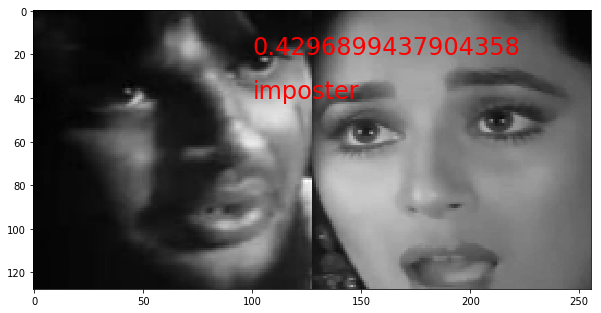

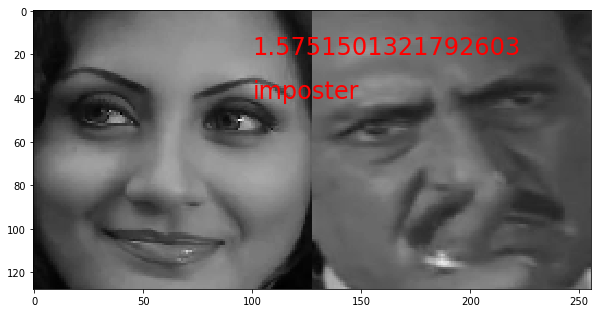

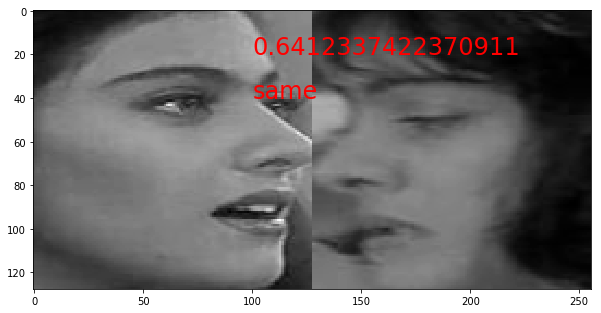

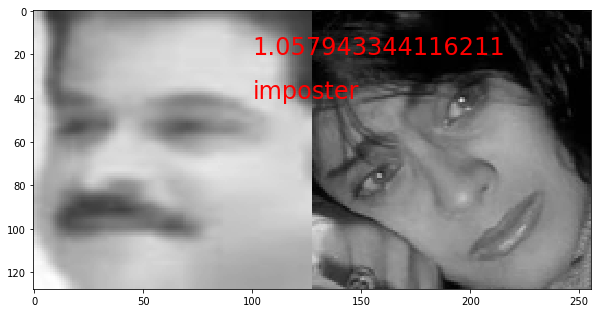

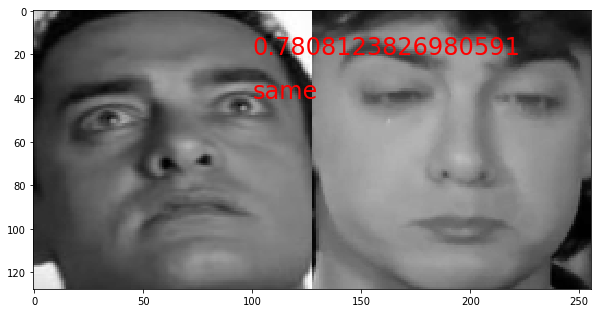

...

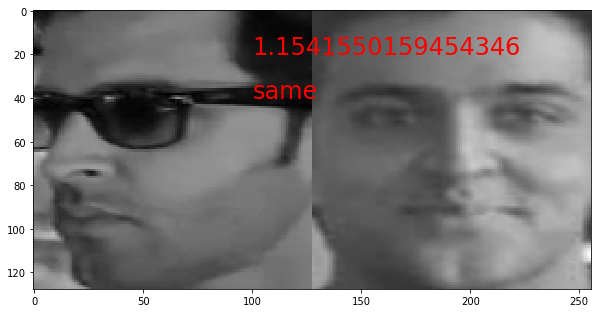

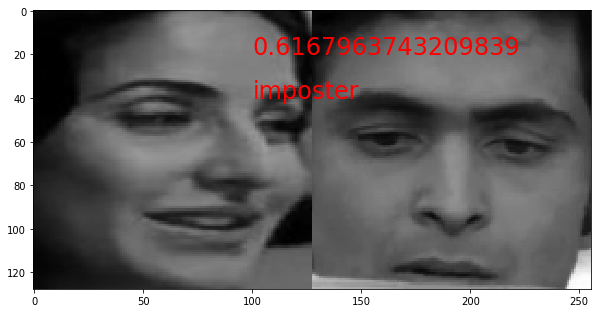

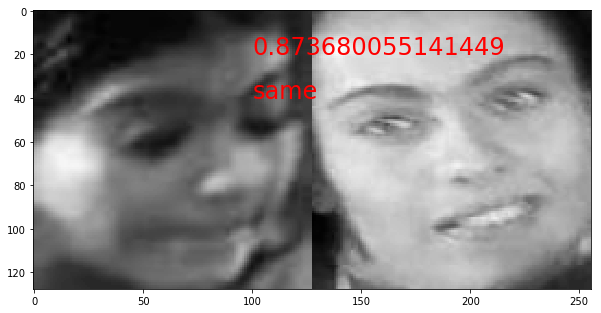

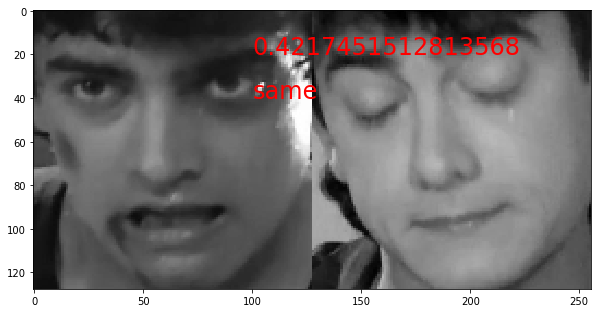

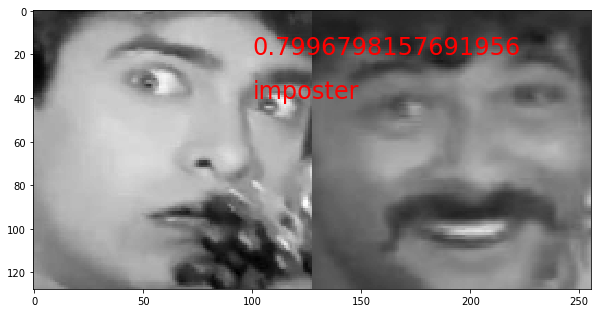

In [0]:
testloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = img_root, image_list = val_list_file, crop=False, mirror=False, 
                                                           resize = True, resize_shape=[128,128]), 
                                           batch_size=1, num_workers=1, shuffle = False, pin_memory=False)

lab = ['same', 'imposter']
with torch.no_grad():
  for batch_idx, (inputs_1, inputs_2, targets) in enumerate(testloader):
      if batch_idx%10 == 0 or int(targets)==0:      ### show every tenth image or if its the same individual

          inputs_1, inputs_2, targets = inputs_1.to(device), inputs_2.to(device), targets.to(device)
          optimizer.zero_grad()
          #inputs_1, inputs_2, targets = inputs_1), Variable(inputs_2), Variable(targets)
          features_1 = feature_net(Variable(inputs_1))     ### get feature for image_1
          features_2 = feature_net(Variable(inputs_2))     ### get feature for image_2

          #dissimilarity = torch.nn.functional.cosine_similarity(features_1, features_2).item()
          dissimilarity = torch.nn.functional.pairwise_distance(features_1, features_2).item()
          img = np.concatenate((inputs_1.data.cpu().numpy()[0][0], inputs_2.data.cpu().numpy()[0][0]), axis = 1)
          plt.figure(figsize=(3,3))
          plt.imshow(img, cmap='gray')
          plt.text(100,20,str(dissimilarity), fontsize=24, color='r')     ### similarity score
          plt.text(100,40,lab[int(targets.data[0])], fontsize=24, color='r')   ### ground truth
          plt.show()


In [0]:
import collections
import os.path as osp

import numpy as np
import PIL.Image
import cv2
import scipy.io
import torch
from torch.utils import data
from random import shuffle
import os.path

import os
import sys
import copy
import time
import math
import matplotlib.pyplot as plt

class custom_data_loader1(data.Dataset):    ### custom data loader
    
    def __init__(self, img_root, image_list, mirror = True, crop = True, crop_shape = [256, 256],
                 resize=False, resize_shape=[128,128], split = 'train', classes = 'IMFDB'):

        self.img_root = img_root
        self.split = split
        
        self.image_list = [line.rstrip('\n') for line in open(image_list)]
        
        self.classes = None
        if classes == 'IIC':
            self.classes = ['Gowri','Priyanka','Rani','Venkat', 'Vinay', 'Vinod']
        elif classes == 'IMFDB':
            self.classes = ['Gowri','Priyanka','Rani','Venkat', 'Vinay', 'Vinod']

        self.mirror = mirror
        self.crop = crop
        self.crop_shape = crop_shape
        
        self.resize = resize
        self.resize_shape = resize_shape

        #self.mean_bgr = np.array([123.68, 116.779, 103.939])   ### mean BGR of ImageNet
        self.mean_bgr = np.array([0])   ### lightnet does not perform mean subtraction of input

        self.files = collections.defaultdict(list)
        for f in self.image_list:
            self.files[self.split].append({'img': img_root+f, 'lbl': 0})
        
    def __len__(self):
        return len(self.files[self.split])

    def __getitem__(self, index):
        
        image_file_name = self.img_root + self.image_list[index]
        
        image = None
        if os.path.isfile(image_file_name):
            image = cv2.imread(image_file_name, 0)  ### 0 indicates load image as grayscale image
        if image is None:
            #print('creating a default image')
            image = np.zeros((self.resize_shape[1], self.resize_shape[0]))
            if self.resize :
                image = cv2.resize(image, (self.resize_shape[1], self.resize_shape[0]))   ### resize_shape is in [rows, cols]
            
            image = image.reshape(image.shape[0], image.shape[1], 1)
            
            if self.mirror:
                flip = np.random.choice(2)*2-1    ### randomly flip the image
                image = image[:, ::flip, :]

            if self.crop:
                image = self.get_random_crop(image, self.crop_shape)

            label = [self.classes.index(i) for i in self.classes if self.image_list[index].split('/')[0] == i][0]
        
            l = torch.IntTensor(1, 1)
            l = label

            return self.transform_image(image), l
            
        else :    
            if self.resize :
                #print('image found resizing')
                image = cv2.resize(image, (self.resize_shape[1], self.resize_shape[0]))   ### resize_shape is in [rows, cols]
            
                image = image.reshape(image.shape[0], image.shape[1], 1)
            
            if self.mirror:
                flip = np.random.choice(2)*2-1    ### randomly flip the image
                image = image[:, ::flip, :]

            if self.crop:
                image = self.get_random_crop(image, self.crop_shape)

            label = [self.classes.index(i) for i in self.classes if self.image_list[index].split('/')[0] == i][0]
        
            l = torch.IntTensor(1, 1)
            l = label

            return self.transform_image(image), l

    def transform_image(self, image):
        image = image.astype(np.float64)
        image -= self.mean_bgr
        image = image.transpose(2, 0, 1)
        image = torch.from_numpy(image.copy()).float()   ### convert from numpy array to torch tensor

        return image


    def get_random_crop(self, im, crop_shape):
        """
        crop shape is of the format: [rows cols]
        """
        r_offset = 0
        c_offset = 0
        
        if im.shape[0] == crop_shape[0]:
            r_offset = 0
        else:
            r_offset = np.random.randint(0, im.shape[0] - crop_shape[0] + 1)
            
        if im.shape[1] == crop_shape[1]:
            c_offset = 0
        else:
            c_offset = np.random.randint(0, im.shape[1] - crop_shape[1] + 1)

        crop_im = im[r_offset: r_offset + crop_shape[0], c_offset: c_offset + crop_shape[1], :]

        return crop_im

### Now we use this network for feature extraction and train an MLP classifier. Feature_net is not updated/train/tweak after this. We only train the MLP classifier.

In [0]:
num_classes = 6

In [0]:
classifier = nn.Sequential(nn.Linear(16, 64), nn.BatchNorm1d(64), nn.ReLU(),
                           nn.Linear(64, 32), nn.BatchNorm1d(32), nn.ReLU(),
                           nn.Linear(32, num_classes))
classifier = classifier.to(device)
criterion = nn.CrossEntropyLoss()
criterion = criterion.to(device)

In [26]:
train_list_file = cf.data_dir+'Classif_train.txt'   #### 5000 images for training
val_list_file = cf.data_dir+'Classif_test.txt'      #### 1095 images for validation


train_image_list = [line.rstrip('\n') for line in open(train_list_file)]
val_image_list = [line.rstrip('\n') for line in open(val_list_file)]

print(len(train_image_list), len(val_image_list))

trainloader = torch.utils.data.DataLoader(custom_data_loader1(img_root = img_root, image_list = train_list_file, crop=False,
                                                             resize = True, resize_shape=[128,128]), 
                                          batch_size=3, num_workers=16, shuffle = True, pin_memory=False)

testloader = torch.utils.data.DataLoader(custom_data_loader1(img_root = img_root, image_list = val_list_file, crop=False, mirror=False, 
                                                           resize = True, resize_shape=[128,128]), 
                                         batch_size=1, num_workers=5, shuffle = False, pin_memory=False)

86 18


In [27]:
print(trainloader.dataset.classes)
print(testloader.dataset.classes)

['Gowri', 'Priyanka', 'Rani', 'Venkat', 'Vinay', 'Vinod']
['Gowri', 'Priyanka', 'Rani', 'Venkat', 'Vinay', 'Vinod']


In [0]:
train_image_list

#### Note: Here too you need to add your new celeb label i..e yourself, before training the MLP.

In [0]:
def train_classifier(epoch):
    print('\nEpoch: %d' % epoch)
    classifier.train()
    train_loss = 0
    correct = 0
    total = 0
    for batch_idx, (inputs, targets) in enumerate(trainloader):
        print("input:",inputs," target: ",targets)
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        #inputs, targets = Variable(inputs), Variable(targets)
        features = feature_net(inputs)      
        print("features:" , features)
        
        outputs = classifier(features)
        size_ = outputs.size()
        outputs_ = outputs.view(size_[0], num_classes)
        loss = criterion(outputs_, targets)
        loss.backward()
        optimizer.step()

        train_loss += loss.data
        _, predicted = torch.max(outputs_.data, 1)
        total += targets.size(0)
        correct += predicted.eq(targets.data).cpu().sum()
        
        progress_bar(batch_idx, len(trainloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                         % (train_loss/(batch_idx+1), 100.*correct/total, correct, total))
        
    train_loss_file.write('%d %.3f %.3f\n' %(epoch, train_loss/len(trainloader), 100.*correct/total))

In [0]:
def test_classifier(epoch):
    global best_acc
    classifier.eval()
    test_loss = 0
    correct = 0
    total = 0
    for batch_idx, (inputs, targets) in enumerate(testloader):
        print("input:",inputs," target: ",targets)
        #if device:
        inputs, targets = inputs.to(device), targets.to(device)
        #inputs, targets = Variable(inputs, volatile=True), Variable(targets)
        features = feature_net(inputs)
        
        outputs = classifier(features)
        size_ = outputs.size()
        outputs_ = outputs.view(size_[0], num_classes)
        loss = criterion(outputs_, targets)

        test_loss += loss.item()
        _, predicted = torch.max(outputs_.data, 1)
        total += targets.size(0)
        correct += predicted.eq(targets.data).cpu().sum()
        
        progress_bar(batch_idx, len(testloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                         % (test_loss/(batch_idx+1), 100.*correct/total, correct, total))
        
    val_loss_file.write('%d %.3f %.3f\n' %(epoch,  test_loss/len(testloader), 100.*correct/total))

    # Save checkpoint.
    acc = 100.*correct/total
    if acc > best_acc:
        print('Saving..')
        state = {
            'net': classifier,
            'acc': acc,
            'epoch': epoch,
        }
        if not os.path.isdir(cf.data_dir+'checkpoint'):
            os.mkdir(cf.data_dir+'checkpoint')
        torch.save(state, cf.data_dir+'checkpoint/classif_ckpt.t7')
        best_acc = acc
    
    return test_loss/len(testloader)

In [0]:
best_acc = 0
experiment = 'siamese_IMFDB'
train_loss_file = open(cf.data_dir+experiment+"train_loss2.txt", "w")
val_loss_file = open(cf.data_dir+experiment+"val_loss2.txt", "w")

In [0]:
optimizer = optim.Adam(classifier.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=2, verbose=True)   #### dynamic LR scheduler
for epoch in range(0, 20):
    train_classifier(epoch)
    test_loss = test_classifier(epoch)
    scheduler.step(test_loss)
    
train_loss_file.close()
val_loss_file.close()

In [0]:
def eval():
    feature_net.eval()
    classifier.eval()
    
    testloader = torch.utils.data.DataLoader(custom_data_loader(img_root = img_root, image_list = val_list_file, crop=False, mirror=False, 
                                                           resize = True, resize_shape=[128,128]), 
                                           batch_size=1, num_workers=1, shuffle = False, pin_memory=False)
    correct = 0
    total = 0
    conf_mat = np.zeros((num_classes, num_classes))
    total_ = 1e-12+np.zeros((num_classes))
    wrong_predictions = []
    for batch_idx, (inputs, targets) in enumerate(testloader):
        #if use_cuda:
        inputs, targets = inputs.to(device), targets.to(device)
        #inputs, targets = Variable(inputs, volatile=True), Variable(targets)
        #features = feature_net.features(inputs).detach()
        features=feature_net(Variable(inputs)) 
        features = features.view(1,-1)
        #print(features.size())        
        outputs = classifier(features)
        size_ = outputs.size()
        outputs_ = outputs.view(size_[0], num_classes)
        _, predicted = torch.max(outputs_.data, 1)
        total += targets.size(0)
        correct += predicted.eq(targets.data).cpu().sum()
        prediction = predicted.cpu().numpy()[0]
        targets = targets.data.cpu().numpy()[0]
        total_[targets] +=1
        conf_mat[predicted, targets] +=1
        
        if prediction != targets:
            wrong_predictions += [[inputs, prediction, targets]]
        
    for k in range(num_classes):
        conf_mat[:,k] /= total_[k]
    return conf_mat, 100.*correct/total, wrong_predictions
    

In [48]:
conf, acc, wrong_predictions = eval()

IndexError: ignored

In [0]:
print(acc)

tensor(4)


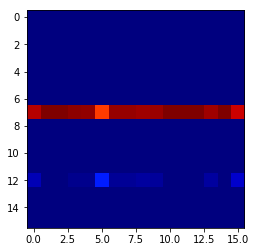

In [0]:
plt.imshow(conf, cmap='jet', vmin=0, vmax = 1)
plt.show()

In [0]:
classes = ['AamairKhan', 'Rimisen', 'Kajol', 'KareenaKapoor','RishiKapoor', 'AmrishPuri', 'AnilKapoor', 'AnupamKher', 'BomanIrani', 'HrithikRoshan', 'KajalAgarwal', 'KatrinaKaif', 'Madhavan', 'MadhuriDixit', 'Umashri', 'Trisha']      #### 1095 images for validation

for w in wrong_predictions[::10]:
    print(classes[w[2]], 'confused with', classes[w[1]])
    plt.imshow(w[0][0][0].data.cpu().numpy(), cmap='gray')
    plt.show()

In [0]:
#Simple classifier
x_train = []
y_train = []
for batch_idx, (inputs, targets) in enumerate(trainloader):
  inputs = inputs.to(device)
  features = feature_net(Variable(inputs)).cpu().detach().numpy()  
  #print('features:', features.shape)
  #print(features[0])
  for i in range(len(features)):
    x_train.append(features[i])
    y_train.append(targets[i].item())
    #print('targets:',i, targets[i])
  

In [0]:
x_train[0]

array([0.65124   , 0.06700643, 0.16238213, 0.52659315, 0.11350327],
      dtype=float32)

In [0]:
len(testloader.dataset.classes)

16

In [0]:
x_test = []
y_test = []
for batch_idx, (inputs, targets) in enumerate(testloader):
  inputs = inputs.to(device)
  features = feature_net(Variable(inputs)).cpu().detach().numpy()  
  #print('features:', features.shape)
  #print(features[0])
  for i in range(len(features)):
    x_test.append(features[i])
    y_test.append(targets[i].item())
    #print('targets:',i, targets[i])

In [0]:
from sklearn import svm

svc = svm.SVC(kernel='rbf', C=1, gamma=1)
svc.fit(x_train, y_train)
svc_pred = svc.predict(x_test)

from sklearn import metrics as me
print(me.accuracy_score(y_test,svc_pred))

0.1735159817351598


In [0]:
from sklearn.neural_network import MLPClassifier
clf = MLPClassifier(hidden_layer_sizes=(5,500,250,100,16), random_state = 123) 
clf.fit(x_train, y_train)

mlp_pred = clf.predict(x_test)
print(me.accuracy_score(y_test,mlp_pred))

0.1415525114155251


/usr/local/lib/python3.6/dist-packages/sklearn/neural_network/multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


In [0]:
trainloader_1 = torch.utils.data.DataLoader(custom_data_loader(img_root = img_root, image_list = train_list_file, crop=False,
                                                             resize = True, resize_shape=[28,28]), 
                                          batch_size=32, num_workers=16, shuffle = True, pin_memory=False)

testloader_1 = torch.utils.data.DataLoader(custom_data_loader(img_root = img_root, image_list = val_list_file, crop=False, mirror=False, 
                                                           resize = True, resize_shape=[28,28]), 
                                         batch_size=32, num_workers=16, shuffle = False, pin_memory=False)

In [0]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(784,50) # YOUR CODE HERE : Define a linear layer whose input size is 784.
        self.fc1_drop = nn.Dropout(0.2)
        self.fc2 = nn.Linear(50, 50)
        self.fc2_drop = nn.Dropout(0.2)
        self.fc3 = nn.Linear(50,16) # YOUR CODE HERE : Define a linear layer.

    def forward(self, x):
        x = x.view(-1, 28*28)
        x = F.relu(self.fc1(x))#Why do we sometimes use F. and sometimes nn.? You could refere the following link: https://discuss.pytorch.org/t/whats-the-difference-between-nn-relu-vs-f-relu/27599
        x = self.fc1_drop(x)
        x = F.relu(self.fc2(x))
        x = self.fc2_drop(x)
        return F.log_softmax(self.fc3(x), dim=1) # YOUR CODE HERE : Define a softmax layer which take inputs as outputs of 'fc3' layer.

In [0]:
model = Net() # YOUR CODE HERE : Declare an object of class 'Net' defined above, and convert it into a CUDA model.
model = model.to(device)

In [0]:
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.5)

In [0]:
for (X_train, y_train) in trainloader_1:
    print('X_train:', X_train.size(), 'type:', X_train.type())
    print('y_train:', y_train.size(), 'type:', y_train.type())
    break

X_train: torch.Size([32, 1, 28, 28]) type: torch.FloatTensor
y_train: torch.Size([32]) type: torch.LongTensor


In [0]:
def train_1(epoch, log_interval=100):
    model.train()
    for batch_idx, (data, target) in enumerate(trainloader_1):
       
        data, target = data.to(device), target.to(device)
        
        # YOUR CODE HERE :  Zero out the gradients using 'zero_grad()'
        optimizer.zero_grad()
        
        output = model(data) # YOUR CODE HERE : Perform Forward pass by passing 'data' as input to the 'model'
        loss = F.nll_loss(output, target)  # YOUR CODE HERE :  Calculate the loss using your favourite loss function
        
        # YOUR CODE HERE : Perform Backward Pass.
        loss.backward()
        
        optimizer.step()
        
        if batch_idx % log_interval == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(trainloader_1.dataset),
                100. * batch_idx / len(trainloader_1), loss.item()))

In [0]:
def test_1(loss_vector, accuracy_vector):
    model.eval()
    test_loss, correct = 0, 0
    for data, target in testloader_1:
        data, target = data.to(device), target.to(device)
        output = model(data) # YOUR CODE HERE : Predict the values of the data by passing 'data' as input to the 'model'.
        test_loss += F.nll_loss(output, target).item()
        pred = output.data.max(1)[1]# YOUR CODE HERE :  Get the index of the max log-probability
        correct += pred.eq(target.data).to(device).sum()

    test_loss /= len(testloader_1)
    loss_vector.append(test_loss)

    accuracy = 100. * correct / len(testloader_1.dataset)# YOUR CODE HERE  : Calculate the accuracy
    accuracy_vector.append(accuracy)
    
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(testloader_1.dataset), accuracy))

In [0]:
%%time
epochs = 100

lossv, accv = [], []
for epoch in range(1, epochs +1):
    train_1(epoch)
    test_1(lossv, accv)

Train Epoch: 1 [0/5000 (0%)]	Loss: 2.709945
Train Epoch: 1 [3200/5000 (64%)]	Loss: 2.761341

Test set: Average loss: 2.7406, Accuracy: 98/1095 (8%)

Train Epoch: 2 [0/5000 (0%)]	Loss: 2.724763
Train Epoch: 2 [3200/5000 (64%)]	Loss: 2.745595

Test set: Average loss: 2.7405, Accuracy: 98/1095 (8%)

Train Epoch: 3 [0/5000 (0%)]	Loss: 2.731761
Train Epoch: 3 [3200/5000 (64%)]	Loss: 2.754539

Test set: Average loss: 2.7404, Accuracy: 98/1095 (8%)

Train Epoch: 4 [0/5000 (0%)]	Loss: 2.730600
Train Epoch: 4 [3200/5000 (64%)]	Loss: 2.749225

Test set: Average loss: 2.7403, Accuracy: 98/1095 (8%)

Train Epoch: 5 [0/5000 (0%)]	Loss: 2.672164
Train Epoch: 5 [3200/5000 (64%)]	Loss: 2.664344

Test set: Average loss: 2.7402, Accuracy: 98/1095 (8%)

Train Epoch: 6 [0/5000 (0%)]	Loss: 2.715894
Train Epoch: 6 [3200/5000 (64%)]	Loss: 2.698754

Test set: Average loss: 2.7402, Accuracy: 98/1095 (8%)

Train Epoch: 7 [0/5000 (0%)]	Loss: 2.756166
Train Epoch: 7 [3200/5000 (64%)]	Loss: 2.734629

Test set: Ave

### Please answer the questions below to complete the experiment:

In [0]:
#@title How was the experiment? { run: "auto", form-width: "500px", display-mode: "form" }
Complexity = "Good and Challenging me" #@param ["Too Simple, I am wasting time", "Good, But Not Challenging for me", "Good and Challenging me", "Was Tough, but I did it", "Too Difficult for me"]


In [0]:
#@title If it was very easy, what more you would have liked to have been added? If it was very difficult, what would you have liked to have been removed? { run: "auto", display-mode: "form" }
Additional = "test" #@param {type:"string"}

In [0]:
#@title Can you identify the concepts from the lecture which this experiment covered? { run: "auto", vertical-output: true, display-mode: "form" }
Concepts = "Yes" #@param ["Yes", "No"]

In [0]:
#@title Run this cell to submit your notebook for grading { vertical-output: true }
try:
  if submission_id:
      return_id = submit_notebook()
      if return_id : submission_id =return_id
  else:
      print("Please complete the setup first.")
except NameError:
  print ("Please complete the setup first.")